# Detection of driveby attacks

- References
    - Working with outliers
        - https://medium.com/analytics-vidhya/how-to-remove-outliers-for-machine-learning-24620c4657e8 
    - Handling imbalanced dataset
        - https://www.kdnuggets.com/2017/06/7-techniques-handle-imbalanced-data.html
        - https://towardsdatascience.com/methods-for-dealing-with-imbalanced-data-5b761be45a18

In [346]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv

#Models
#TODO: import naive bayes classifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

#Evaluation Metrics
from sklearn.metrics import confusion_matrix
from sklearn.feature_selection import mutual_info_classif

### Data Cleaning

- Duplicates
    - This can mainly come from the malware websites, since most of their urls point directly to a specific webpage
- Null values
    - They are not present in the dataset, this is because the feature values are numerical and if the feature does not exist within a website then it will be denoted by 0
- Data distribution
    - Check the distribution of the classes to see whether they represent the real world distribution of the dataset
- Consistency
    - Check for unique values for each feature to see if there are any inconsistecies

In [282]:
with open("Driveby-attack/AllFeatures.csv") as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    features = list(csv_reader)[0]  #The column names of the pandas dataframe

In [283]:
print(features)

['eval', 'setTimeout', 'iframe', 'unescape', 'escape', 'classid', 'parseInt', 'fromCharCode', 'ActiveXObject', 'concat', 'indexOf', 'substring', 'replace', 'document.addEventListener', 'attachEvent', 'createElement', 'getElementById', 'document.write', 'iframe2', 'No. of string  direct assignments', 'No. of characters in JavaScript', 'The No. of Long Strings >200', 'No. of Blank Spaces', 'Share of space characters', 'Entropy of  JavaScript', 'No. Hex Values', 'JavaScript Keywords', 'The ratio between keywords and words lex', 'JavaScript word count lex', 'Length of Longest JavaScript Word lex', 'Length of shortest JavaScript Word lex', 'Entropy of the Longest JavaScript Word lex', 'Average Length of Words lex', 'The ratio between keywords and words', 'JavaScript word count', 'Length of Longest JavaScript Word', 'Length of shortest JavaScript Word', 'Entropy of the Longest JavaScript Word', 'Average Length of Words']


In [284]:
column_names = ["site"]+features+["label"]
good_sites = pd.read_csv("Driveby-attack/ExtractedFeatures.csv", names=column_names, header=None)   #The features from good websites
bad_sites = pd.read_csv("Driveby-attack/BadExtractedFeatures.csv", names=column_names, header=None)    #The features from bad websites

good_bad_sites = pd.concat([good_sites, bad_sites], ignore_index=True) #The combination of the good and bad websites
good_bad_sites.drop(['site', 'iframe2'], axis=1, inplace=True)

Checking Duplicates and removing them

In [285]:
good_bad_sites[good_bad_sites.duplicated()]   #Checking for duplicates

,eval,setTimeout,iframe,unescape,escape,classid,parseInt,fromCharCode,ActiveXObject,concat,...,Length of shortest JavaScript Word lex,Entropy of the Longest JavaScript Word lex,Average Length of Words lex,The ratio between keywords and words,JavaScript word count,Length of Longest JavaScript Word,Length of shortest JavaScript Word,Entropy of the Longest JavaScript Word,Average Length of Words,label
7,0,0,0,0,0,0,0,0,0,0,...,0,0.000000,0.000000,0.000000,0,0,0,0.000000,0.000000,good
8,0,0,0,0,0,0,0,0,0,0,...,0,0.000000,0.000000,0.000000,0,0,0,0.000000,0.000000,good
9,0,0,0,0,0,0,0,0,0,0,...,0,0.000000,0.000000,0.000000,0,0,0,0.000000,0.000000,good
14,0,0,0,0,0,0,0,0,0,0,...,0,0.000000,0.000000,0.000000,0,0,0,0.000000,0.000000,good
16,0,0,0,0,0,0,0,0,0,0,...,0,0.000000,0.000000,0.000000,0,0,0,0.000000,0.000000,good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
952,0,0,0,0,0,0,0,0,0,0,...,0,0.000000,0.000000,0.000000,0,0,0,0.000000,0.000000,bad
953,0,0,0,0,0,0,0,0,0,0,...,0,0.000000,0.000000,0.000000,0,0,0,0.000000,0.000000,bad
954,3,7,4,0,0,1,1,2,4,7,...,8,36.113018,53.873299,4.272169,19098,823,21,36.113018,116.726224,bad
955,0,2,1,0,0,0,0,0,0,0,...,3,13.259226,14.521464,1.187489,151,217,7,13.259226,29.732526,bad


In [286]:
good_bad_sites = good_bad_sites[~good_bad_sites.duplicated()].dropna()  #Removing duplicates

In [287]:
good_bad_sites.info()  #Checking the datatypes of the features

<class 'pandas.core.frame.DataFrame'>
Int64Index: 586 entries, 0 to 946
Data columns (total 39 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   eval                                        586 non-null    int64  
 1   setTimeout                                  586 non-null    int64  
 2   iframe                                      586 non-null    int64  
 3   unescape                                    586 non-null    int64  
 4   escape                                      586 non-null    int64  
 5   classid                                     586 non-null    int64  
 6   parseInt                                    586 non-null    int64  
 7   fromCharCode                                586 non-null    int64  
 8   ActiveXObject                               586 non-null    int64  
 9   concat                                      586 non-null    int64  
 10  indexOf       

In [288]:
good_bad_sites.shape  #Checking the dimensionality of the data

(586, 39)

In [289]:
good_bad_sites.head()   #Printing the sample data

,eval,setTimeout,iframe,unescape,escape,classid,parseInt,fromCharCode,ActiveXObject,concat,...,Length of shortest JavaScript Word lex,Entropy of the Longest JavaScript Word lex,Average Length of Words lex,The ratio between keywords and words,JavaScript word count,Length of Longest JavaScript Word,Length of shortest JavaScript Word,Entropy of the Longest JavaScript Word,Average Length of Words,label
0,1,93,16,1,9,0,29,6,2,46,...,17,66.271178,70.006721,6.332164,77680,1524,38,65.578234,147.663971,good
1,1,10,1,1,1,0,3,0,5,3,...,9,37.794234,27.145852,2.897497,20023,3217,10,37.794234,54.358997,good
2,0,0,0,0,0,0,0,0,0,0,...,2,8.122372,7.605006,0.702128,102,100,7,8.122372,16.311170,good
3,1,93,16,1,9,0,29,6,2,46,...,17,66.265203,70.010765,6.335774,77680,1521,38,65.572258,147.675703,good
4,1,10,1,1,1,0,3,0,5,3,...,9,37.800869,27.108051,2.897497,20023,3184,10,37.800869,54.267837,good


#### Removing noise from the dataset

- Sites with zero javascript words/characters
    - Some websites are not written in javascript hence they have 0 javascript words
        - These sites have to be removed from the feature set as they will add noise to the dataset
    - Some sites return inconsistent data, hence they must also be removed as they will also add more noise

In [290]:
indeces_chars = list(good_bad_sites[good_bad_sites['No. of characters in JavaScript']==0].index.values)  #Indeces of zero chars
indeces_lex_words = list(good_bad_sites[good_bad_sites['JavaScript word count lex']==0].index.values)  #Indeces of zero lexical words
indeces_words = list(good_bad_sites[good_bad_sites['JavaScript word count']==0].index.values)  #Indeces of zero words
indeces_ave_lex_words = list(good_bad_sites[good_bad_sites["Average Length of Words lex"]==np.inf].index.values)  #Indeces of zero words
indeces_ave_words = list(good_bad_sites[good_bad_sites['Average Length of Words']==np.inf].index.values)  #Indeces of zero words
indeces_rat_lex_words = list(good_bad_sites[good_bad_sites['The ratio between keywords and words lex']==np.inf].index.values)  #Indeces of zero words
indeces_rat_words = list(good_bad_sites[good_bad_sites['The ratio between keywords and words']==np.inf].index.values)  #Indeces of zero words

indeces_remove = np.unique(indeces_chars+indeces_lex_words+indeces_words+indeces_ave_lex_words+indeces_ave_words+
                           indeces_rat_lex_words+indeces_rat_words) #Indeces to remove
for index in indeces_remove:
    good_bad_sites = good_bad_sites.drop(index=index)
    
good_bad_sites = good_bad_sites.reset_index()

In [291]:
good_bad_sites["label"].value_counts()

good    432
bad      62
Name: label, dtype: int64

In [331]:
dist =  good_bad_sites["label"].value_counts()
print((dist['good']/(dist['good']+dist['bad']))*100)

87.4493927125506


In [292]:
#good_bad_sites.to_csv("processed_features.csv")  #Saving the processed features to be used later on

Data distribution

<AxesSubplot:>

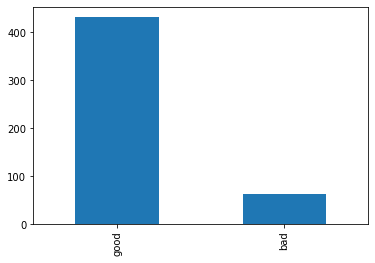

In [293]:
good_bad_sites["label"].value_counts().plot(kind="bar")

### EDA

- Check distributions of the features to see whether there are any outliers
    - If the outliers exist, explore ways of dealing with them
    - The distributions will also help us with selecting the correct Naive Bayes model
    - This will also help us with finding the distribution of the rare class and using that for oversampling
- Check for any dependence between the features (both visually and analytically)
- Check if we can make some conclusions based on the visializations of some combinations of the features
- Check the information values of the features to rank them

In [294]:
corr_mat = good_bad_sites.corr() #Correlation matrix

In [295]:
corr_mat

,index,eval,setTimeout,iframe,unescape,escape,classid,parseInt,fromCharCode,ActiveXObject,...,Length of Longest JavaScript Word lex,Length of shortest JavaScript Word lex,Entropy of the Longest JavaScript Word lex,Average Length of Words lex,The ratio between keywords and words,JavaScript word count,Length of Longest JavaScript Word,Length of shortest JavaScript Word,Entropy of the Longest JavaScript Word,Average Length of Words
index,1.000000,-0.007380,-0.133278,-0.131181,-0.063010,-0.043378,0.117810,-0.088731,-0.043693,-0.156962,...,0.021467,-0.080033,-0.075520,0.003437,-0.015562,-0.125060,0.020229,-0.072228,-0.082737,0.011899
eval,-0.007380,1.000000,0.344044,0.262193,0.687806,0.609795,0.007825,0.374313,0.344030,0.304393,...,0.912090,0.348943,0.360087,0.645058,0.384414,0.343952,0.907525,0.365408,0.367377,0.760349
setTimeout,-0.133278,0.344044,1.000000,0.631354,0.252059,0.507420,0.038822,0.842904,0.798538,0.640635,...,0.095784,0.899922,0.899908,0.210612,0.285130,0.936774,0.083764,0.788625,0.915922,0.168169
iframe,-0.131181,0.262193,0.631354,1.000000,0.350925,0.451682,0.072804,0.810364,0.727529,0.734079,...,0.154940,0.511789,0.502623,0.427225,0.545832,0.759000,0.151505,0.594192,0.516630,0.345733
unescape,-0.063010,0.687806,0.252059,0.350925,1.000000,0.606897,0.022861,0.411807,0.227897,0.133690,...,0.735560,0.191106,0.203787,0.678519,0.543019,0.251123,0.735423,0.210549,0.209464,0.719516
escape,-0.043378,0.609795,0.507420,0.451682,0.606897,1.000000,0.063370,0.484523,0.599466,0.445157,...,0.466105,0.440034,0.440333,0.390723,0.304363,0.534723,0.454563,0.469270,0.449472,0.423850
classid,0.117810,0.007825,0.038822,0.072804,0.022861,0.063370,1.000000,0.079019,0.037243,0.046090,...,-0.011445,0.030597,0.028568,-0.008122,-0.008765,0.036023,-0.011344,0.048914,0.029821,-0.009320
parseInt,-0.088731,0.374313,0.842904,0.810364,0.411807,0.484523,0.079019,1.000000,0.756089,0.618484,...,0.284661,0.740919,0.743312,0.578463,0.690807,0.868380,0.277610,0.703871,0.759337,0.493964
fromCharCode,-0.043693,0.344030,0.798538,0.727529,0.227897,0.599466,0.037243,0.756089,1.000000,0.826556,...,0.111436,0.708882,0.700482,0.242242,0.313459,0.903566,0.098414,0.748640,0.709763,0.197079
ActiveXObject,-0.156962,0.304393,0.640635,0.734079,0.133690,0.445157,0.046090,0.618484,0.826556,1.000000,...,0.050310,0.574873,0.557180,0.114406,0.162323,0.796918,0.045128,0.666442,0.570726,0.091595


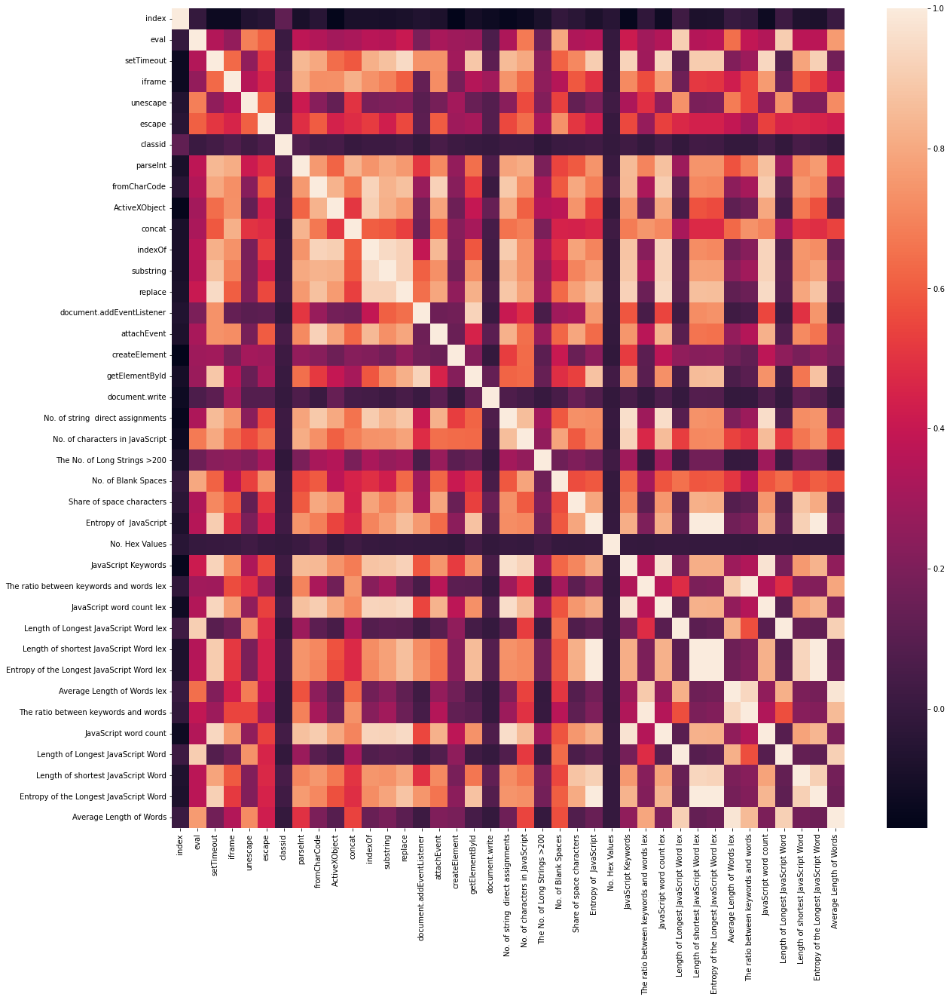

In [296]:
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(corr_mat, xticklabels=True, yticklabels=True, ax=ax)
plt.show()

In [297]:
dependent = []  #A triple containing dependent features and their correlation score
corr_columns = corr_mat.columns  # The column names of the correlation matrix
for i in range(corr_mat.shape[0]):
    for j in range(corr_mat.shape[1]):
        if (corr_mat.iloc[i, j]>=0.5 or corr_mat.iloc[i, j]<=-0.5) and i!=j:
            dependent.append([corr_columns[i], corr_columns[j], corr_mat.iloc[i, j]])

In [298]:
print(len(dependent))

622


In [299]:
dependent_df = pd.DataFrame(dependent, columns = ['Feature1', 'Feature2', 'Correlation Coefficient'])

In [300]:
dependent_df

,Feature1,Feature2,Correlation Coefficient
0,eval,unescape,0.687806
1,eval,escape,0.609795
2,eval,No. of characters in JavaScript,0.674406
3,eval,No. of Blank Spaces,0.795022
4,eval,Length of Longest JavaScript Word lex,0.912090
...,...,...,...
617,Average Length of Words,The ratio between keywords and words lex,0.791144
618,Average Length of Words,Length of Longest JavaScript Word lex,0.913940
619,Average Length of Words,Average Length of Words lex,0.980427
620,Average Length of Words,The ratio between keywords and words,0.849564


#### Visualizing the relationship between the features

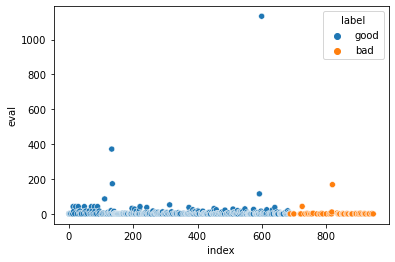

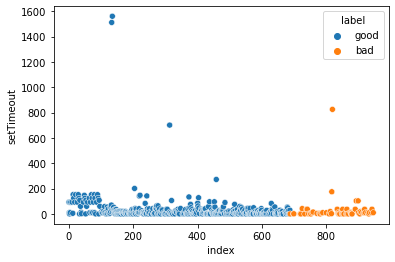

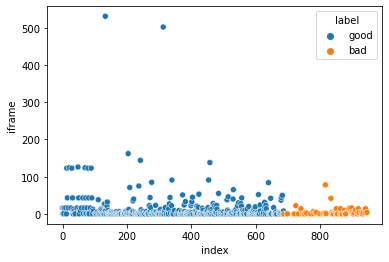

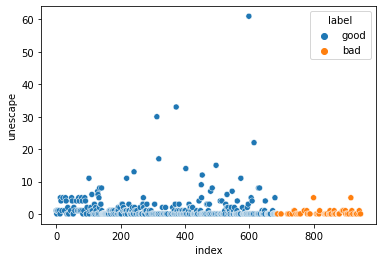

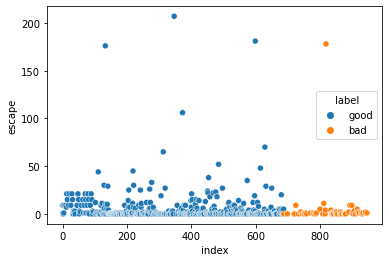

...

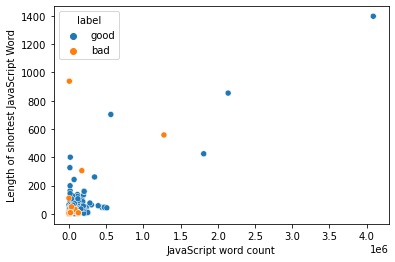

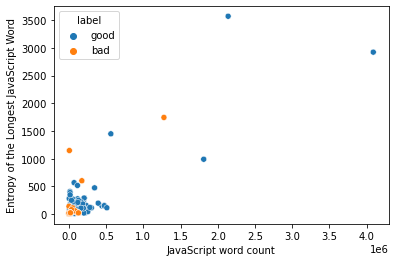

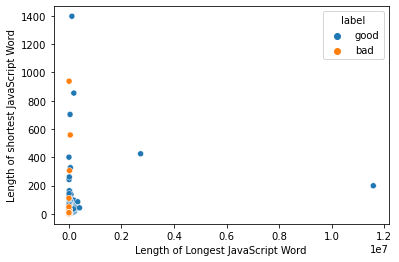

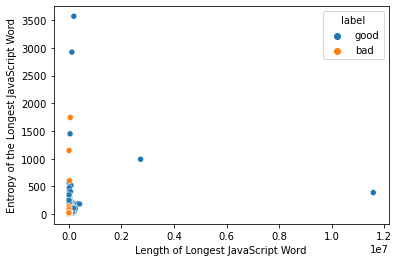

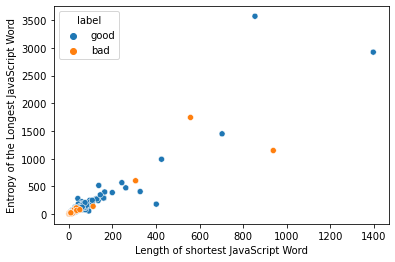

In [301]:
columns = good_bad_sites.columns
for i in range(len(columns)-1):
    for j in range(i+1, len(columns)-2):
        sns.scatterplot(x=columns[i], y=corr_columns[j], hue="label", data=good_bad_sites)
        plt.show()

- Comment
    - The index seems to be a key feature in classifying the labels
    - From the graphs above, the index and eval features appear to be the key features in classifying the websites

Checking the distributions

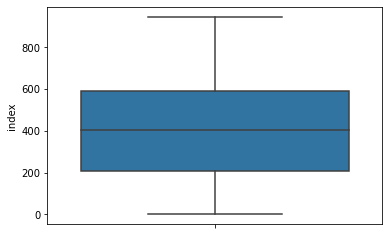

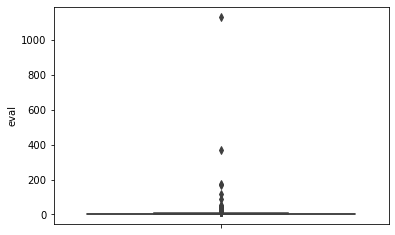

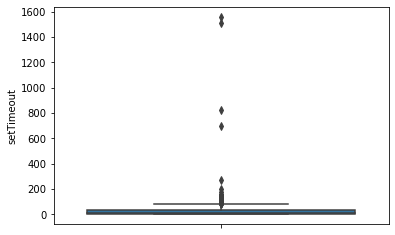

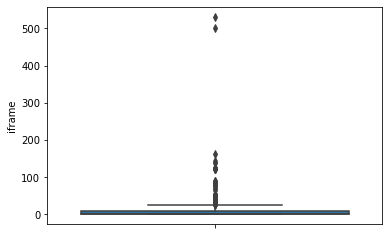

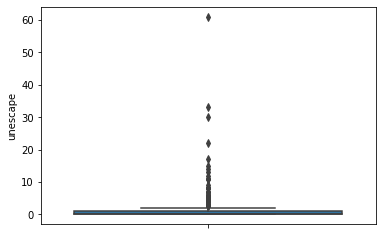

...

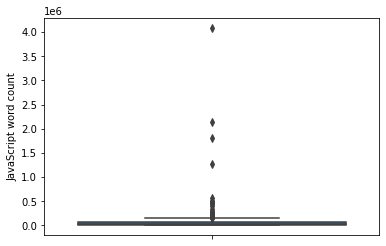

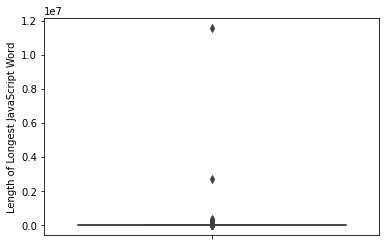

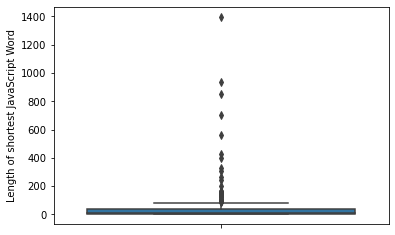

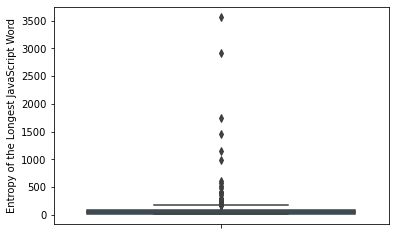

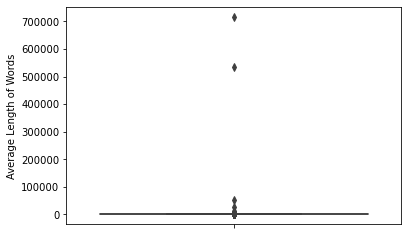

In [302]:
for column_name in columns:
    if column_name!="site" and column_name!="label":
        sns.boxplot(y=good_bad_sites[column_name])
        plt.show()

Dealing with outliers

In [307]:
data_scale = good_bad_sites.loc[:, ~good_bad_sites.columns.isin(['label'])]
scaler = StandardScaler()
scaler.fit(data_scale)
scaled_data = scaler.transform(data_scale)
scaled_data_df = pd.DataFrame(scaled_data, columns = data_scale.columns)

In [308]:
le = LabelEncoder()
le.fit(good_bad_sites['label'])
labels = le.transform(good_bad_sites['label'])
scaled_data_df["label"] = labels
scaled_data_df.head()

,index,eval,setTimeout,iframe,unescape,escape,classid,parseInt,fromCharCode,ActiveXObject,...,Length of shortest JavaScript Word lex,Entropy of the Longest JavaScript Word lex,Average Length of Words lex,The ratio between keywords and words,JavaScript word count,Length of Longest JavaScript Word,Length of shortest JavaScript Word,Entropy of the Longest JavaScript Word,Average Length of Words,label
0,-1.715699,-0.129106,0.530676,0.088420,-0.082077,0.160478,-0.172062,0.055010,0.027933,-0.016051,...,-0.057580,-0.073590,-0.072969,-0.068500,0.037691,-0.079893,0.025785,-0.072823,-0.070010,1
1,-1.711561,-0.129106,-0.205338,-0.292505,-0.082077,-0.261484,-0.172062,-0.233729,-0.263589,0.367625,...,-0.188360,-0.186039,-0.075891,-0.075695,-0.201750,-0.076731,-0.249417,-0.185340,-0.072330,1
2,-1.707424,-0.147179,-0.294014,-0.317900,-0.326332,-0.314229,-0.172062,-0.267045,-0.263589,-0.271836,...,-0.302792,-0.303206,-0.077223,-0.080294,-0.284478,-0.082553,-0.278903,-0.305504,-0.073277,1
3,-1.703286,-0.129106,0.530676,0.088420,-0.082077,0.160478,-0.172062,0.055010,0.027933,-0.016051,...,-0.057580,-0.073613,-0.072968,-0.068492,0.037691,-0.079899,0.025785,-0.072847,-0.070009,1
4,-1.699148,-0.129106,-0.205338,-0.292505,-0.082077,-0.261484,-0.172062,-0.233729,-0.263589,0.367625,...,-0.188360,-0.186013,-0.075893,-0.075695,-0.201750,-0.076793,-0.249417,-0.185314,-0.072333,1


#### Mutual information score

In [348]:
mi = mutual_info_classif(scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'])

In [351]:
mi_df = pd.DataFrame(zip(scaled_data_df.columns, mi), columns=["Feature", "Mutual information score"])

In [352]:
mi_df

,Feature,Mutual information score
0,index,0.367517
1,eval,0.045049
2,setTimeout,0.045631
3,iframe,0.046261
4,unescape,0.034340
5,escape,0.011982
6,classid,0.014102
7,parseInt,0.095068
8,fromCharCode,0.039109
9,ActiveXObject,0.031252


- Comment 
    - The index(indexOf() function) feature has the highest information score when compared with the other features

### Model Implementation

- Model
    - Naive Bayes (This model assumes that there's no depedence among the features, however I think some functions depend on whether other functions exist, or whether there are some string validations.....To be confirmed with the dependence check from EDA)
    - J48 Decision Tree
    - Random Forest 
    - REPTree
    - ADTree
    - AdaBoost
        - The tree algorithms can work well with class imbalance
    - SVM
    - MLP (added this model to test how the above models compare to a sophisticated model)
- Reason for choosing above models
    - They are used in literature and we can benchmark our results based on their results
- Evaluation Metrics
    - Confusion Matrix
    - Accuracy
    - Precision
    - Recall
    - F_1 Score
    - ROC Curve

### Dealing with the class imbalance
- Evaluation metrics
    - The accuracy will be compared with the accuracy of the model which guesses the majority class every time
        - If the accuracy is the model is higher then we will not consider the accuracy as one of the evaluation metrics
        - Else the accuracy will be considered
- Upsampling
    - This will be useful if we want to include accuracy into the list of evaluation metrics
    - It also increases our dataset, hence we can use MLP

Models

In [313]:
mlp_model = MLPClassifier()
adaboost_model = AdaBoostClassifier()
svm_model = SVC()
rf_model = RandomForestClassifier()
j48_model = DecisionTreeClassifier()
rep_model = DecisionTreeClassifier()
ad_model = DecisionTreeClassifier()

In [314]:
kf = KFold(n_splits=10, shuffle=True) #10-fold cross validation

### Before Feature selection

#### Evaluation metrics

In [343]:
rf_score1 = cross_val_score(rf_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='accuracy')
rf_score2 = cross_val_score(rf_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='precision') 
rf_score3 = cross_val_score(rf_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='recall')
rf_score4 = cross_val_score(rf_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='f1') 
rf_score5 = cross_val_score(rf_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='roc_auc') 

In [344]:
print("Accuracy: ", np.mean(rf_score1)*100)
print("Precision: ", np.mean(rf_score2)*100)
print("Recall: ", np.mean(rf_score3)*100)
print("F1 score: ", np.mean(rf_score4)*100)
print("ROC AUC: ", np.mean(rf_score5)*100)

Accuracy:  99.39183673469387
Precision:  99.30050505050507
Recall:  100.0
F1 score:  99.6621472545461
ROC AUC:  99.95454545454547


In [327]:
adaboost_score1 = cross_val_score(adaboost_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='accuracy')
adaboost_score2 = cross_val_score(adaboost_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='precision') 
adaboost_score3 = cross_val_score(adaboost_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='recall')
adaboost_score4 = cross_val_score(adaboost_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='f1') 
adaboost_score5 = cross_val_score(adaboost_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='roc_auc') 

In [328]:
print("Accuracy: ", np.mean(adaboost_score1)*100)
print("Precision: ", np.mean(adaboost_score2)*100)
print("Recall: ", np.mean(adaboost_score3)*100)
print("F1 score: ", np.mean(adaboost_score4)*100)
print("ROC AUC: ", np.mean(adaboost_score5)*100)

Accuracy:  99.59591836734694
Precision:  99.78260869565216
Recall:  99.76744186046511
F1 score:  99.78237729154348
ROC AUC:  99.42640692640691


In [329]:
svm_score1 = cross_val_score(svm_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='accuracy')
svm_score2 = cross_val_score(svm_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='precision') 
svm_score3 = cross_val_score(svm_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='recall')
svm_score4 = cross_val_score(svm_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='f1') 
svm_score5 = cross_val_score(svm_model, scaled_data_df.loc[:, ~scaled_data_df.columns.isin(['label'])], scaled_data_df['label'], cv=kf, scoring='roc_auc') 

In [330]:
print("Accuracy: ", np.mean(svm_score1)*100)
print("Precision: ", np.mean(svm_score2)*100)
print("Recall: ", np.mean(svm_score3)*100)
print("F1 score: ", np.mean(svm_score4)*100)
print("ROC AUC: ", np.mean(svm_score5)*100)

Accuracy:  97.57959183673469
Precision:  97.11136389169755
Recall:  100.0
F1 score:  98.35743372186647
ROC AUC:  99.52499604492961


#### Upsampling

### After Feature selection

#### Evaluation metrics

In [335]:
svma_score1 = cross_val_score(svm_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='accuracy')
svma_score2 = cross_val_score(svm_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='precision') 
svma_score3 = cross_val_score(svm_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='recall')
svma_score4 = cross_val_score(svm_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='f1') 
svma_score5 = cross_val_score(svm_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='roc_auc') 

In [336]:
print("Accuracy: ", np.mean(svma_score1)*100)
print("Precision: ", np.mean(svma_score2)*100)
print("Recall: ", np.mean(svma_score3)*100)
print("F1 score: ", np.mean(svma_score4)*100)
print("ROC AUC: ", np.mean(svma_score5)*100)

Accuracy:  98.38775510204081
Precision:  98.19044099531907
Recall:  100.0
F1 score:  99.05758403657116
ROC AUC:  99.94047619047619


In [337]:
print("Accuracy: ", np.mean(svm_score1)*100)
print("Precision: ", np.mean(svm_score2)*100)
print("Recall: ", np.mean(svm_score3)*100)
print("F1 score: ", np.mean(svm_score4)*100)
print("ROC AUC: ", np.mean(svm_score5)*100)

Accuracy:  97.57959183673469
Precision:  97.11136389169755
Recall:  100.0
F1 score:  98.35743372186647
ROC AUC:  99.52499604492961


In [340]:
rfa_score1 = cross_val_score(rf_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='accuracy')
rfa_score2 = cross_val_score(rf_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='precision') 
rfa_score3 = cross_val_score(rf_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='recall')
rfa_score4 = cross_val_score(rf_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='f1') 
rfa_score5 = cross_val_score(rf_model, scaled_data_df[["index", "eval"]], scaled_data_df['label'], cv=kf, scoring='roc_auc') 

In [341]:
print("Accuracy: ", np.mean(rfa_score1)*100)
print("Precision: ", np.mean(rfa_score2)*100)
print("Recall: ", np.mean(rfa_score3)*100)
print("F1 score: ", np.mean(rfa_score4)*100)
print("ROC AUC: ", np.mean(rfa_score5)*100)

Accuracy:  99.8
Precision:  99.53870625662778
Recall:  100.0
F1 score:  99.63841422334218
ROC AUC:  99.96598639455783


In [345]:
print("Accuracy: ", np.mean(rf_score1)*100)
print("Precision: ", np.mean(rf_score2)*100)
print("Recall: ", np.mean(rf_score3)*100)
print("F1 score: ", np.mean(rf_score4)*100)
print("ROC AUC: ", np.mean(rf_score5)*100)

Accuracy:  99.39183673469387
Precision:  99.30050505050507
Recall:  100.0
F1 score:  99.6621472545461
ROC AUC:  99.95454545454547


#### Upsampling